# Using Altair to plot a road trip

In [214]:
import altair as alt
import pandas as pd
import geopandas as gpd

import json
import datetime

## Create Background Map

Use geopandas to create an Altair chart

In [215]:
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
world  = world[world.name=='Australia'] # 

data  = alt.InlineData(values = alt.utils.core.sanitize_dataframe(world).to_json(), #geopandas to geojson string
                       # root object type is "FeatureCollection" but we need its features
                       format = alt.DataFormat(property='features',type='json')) 
#c1 = alt.Chart(data, background='skyblue', padding=20,
c1 = alt.Chart(data ,
    ).mark_geoshape(fill='cornsilk', stroke='gray', color='black'
    ).encode( 
        tooltip='properties.name:N'
    ).properties( 
        projection={"type":'equirectangular'},
        width=800,
        height=400
    ) # .configure_view(strokeWidth=0)


Show the background

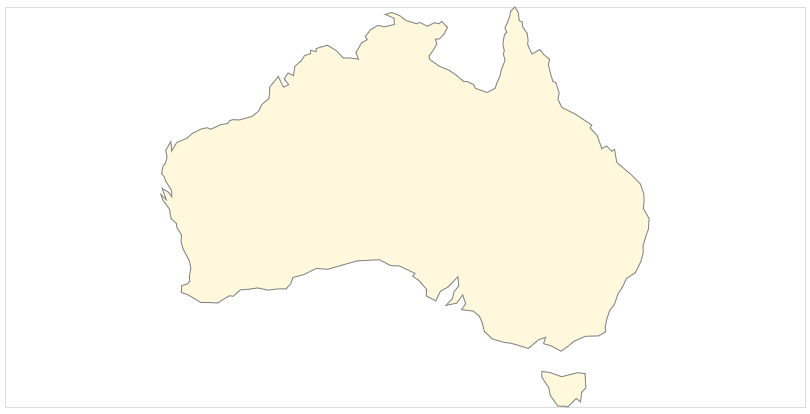

In [216]:
c1


## Access and process Google location data

We read the JSON file, and convert it into a pandas DataFrame

In [217]:
loc_data = 'D:\\GoogleLocnData\\Takeout\\Location History\\Location History.json'

with open(loc_data, 'r') as fh:
    raw = json.loads(fh.read())
#end with
ld = pd.DataFrame(raw['locations'])

In [218]:
ld.head()

,accuracy,activity,altitude,heading,latitudeE7,longitudeE7,timestampMs,velocity,verticalAccuracy
0,17,"[{'timestampMs': '1529898559903', 'activity': ...",NaN,NaN,-265270220,1530867411,1529898679106,NaN,NaN
1,16,"[{'timestampMs': '1529898317945', 'activity': ...",NaN,NaN,-265269680,1530867592,1529898378733,NaN,NaN
2,16,"[{'timestampMs': '1529897953895', 'activity': ...",NaN,NaN,-265270683,1530867290,1529898072959,NaN,NaN
3,16,"[{'timestampMs': '1529897711591', 'activity': ...",NaN,NaN,-265270683,1530867290,1529897772884,NaN,NaN
4,16,"[{'timestampMs': '1529897349885', 'activity': ...",NaN,NaN,-265269680,1530867592,1529897468087,NaN,NaN


Remove all rows that don't have activity data

In [219]:
ld = ld[ld['activity'].notnull()].copy()

Extract the activity name from the structure holding activity data.

Note: we only extract the first activity, and don't check the CONFIDENCE value

In [220]:
ld['ActivityType'] = [ x[0]['activity'][0]['type'] for x in ld['activity'] ]

Determine what activities Google knows about, and how many location snapshots are associated with each activity

In [221]:
ld['ActivityType'].unique()

array(['STILL', 'ON_FOOT', 'TILTING', 'UNKNOWN', 'ON_BICYCLE',
       'EXITING_VEHICLE', 'IN_VEHICLE'], dtype=object)

In [222]:
ld['ActivityType'].value_counts()

STILL              347595
ON_FOOT             31300
TILTING             17557
UNKNOWN             16675
IN_VEHICLE          14796
EXITING_VEHICLE       547
ON_BICYCLE            268
Name: ActivityType, dtype: int64

Convert the latitude and longitude values, and get a date time value from timestamps

In [223]:
ld['latitude'] = ld['latitudeE7']/float(1e7)
ld['longtitude'] = ld['longitudeE7']/float(1e7)

ld['timestampMsFl'] = ld['timestampMs'].astype(float)

ld['timestamp'] = ld['timestampMsFl']/1000.0

ld['datetime'] = ld['timestamp'].map(datetime.datetime.fromtimestamp)

In [224]:
ld.head()

,accuracy,activity,altitude,heading,latitudeE7,longitudeE7,timestampMs,velocity,verticalAccuracy,ActivityType,latitude,longtitude,timestampMsFl,timestamp,datetime
0,17,"[{'timestampMs': '1529898559903', 'activity': ...",NaN,NaN,-265270220,1530867411,1529898679106,NaN,NaN,STILL,-26.527022,153.086741,1.529899e+12,1.529899e+09,2018-06-25 13:51:19.106
1,16,"[{'timestampMs': '1529898317945', 'activity': ...",NaN,NaN,-265269680,1530867592,1529898378733,NaN,NaN,STILL,-26.526968,153.086759,1.529898e+12,1.529898e+09,2018-06-25 13:46:18.733
2,16,"[{'timestampMs': '1529897953895', 'activity': ...",NaN,NaN,-265270683,1530867290,1529898072959,NaN,NaN,STILL,-26.527068,153.086729,1.529898e+12,1.529898e+09,2018-06-25 13:41:12.959
3,16,"[{'timestampMs': '1529897711591', 'activity': ...",NaN,NaN,-265270683,1530867290,1529897772884,NaN,NaN,STILL,-26.527068,153.086729,1.529898e+12,1.529898e+09,2018-06-25 13:36:12.884
4,16,"[{'timestampMs': '1529897349885', 'activity': ...",NaN,NaN,-265269680,1530867592,1529897468087,NaN,NaN,STILL,-26.526968,153.086759,1.529897e+12,1.529897e+09,2018-06-25 13:31:08.087


Filter in all rows in the road trip date range, with IN_VEHICLE activity name

In [225]:
ld = ld[ld['timestamp']>datetime.datetime(2018, 5, 31).timestamp()].copy()

ld = ld[ld['timestamp']<datetime.datetime(2018, 6, 19).timestamp()].copy()

ld = ld[ld['ActivityType']=='IN_VEHICLE'].copy()


ld.head()

,accuracy,activity,altitude,heading,latitudeE7,longitudeE7,timestampMs,velocity,verticalAccuracy,ActivityType,latitude,longtitude,timestampMsFl,timestamp,datetime
3275,31,"[{'timestampMs': '1529209352733', 'activity': ...",NaN,NaN,-265269133,1530867244,1529210003351,NaN,NaN,IN_VEHICLE,-26.526913,153.086724,1.529210e+12,1.529210e+09,2018-06-17 14:33:23.351
3280,2500,"[{'timestampMs': '1529208688352', 'activity': ...",NaN,NaN,-261955642,1526554298,1529208916014,NaN,NaN,IN_VEHICLE,-26.195564,152.655430,1.529209e+12,1.529209e+09,2018-06-17 14:15:16.014
3282,2500,"[{'timestampMs': '1529208278750', 'activity': ...",NaN,NaN,-261955642,1526554298,1529208668923,NaN,NaN,IN_VEHICLE,-26.195564,152.655430,1.529209e+12,1.529209e+09,2018-06-17 14:11:08.923
3285,2500,"[{'timestampMs': '1529206740700', 'activity': ...",NaN,NaN,-261955642,1526554298,1529207629905,NaN,NaN,IN_VEHICLE,-26.195564,152.655430,1.529208e+12,1.529208e+09,2018-06-17 13:53:49.905
3291,100,"[{'timestampMs': '1529205707212', 'activity': ...",NaN,NaN,-261904588,1526593391,1529206541636,NaN,NaN,IN_VEHICLE,-26.190459,152.659339,1.529207e+12,1.529207e+09,2018-06-17 13:35:41.636


In [226]:
ld.tail()

,accuracy,activity,altitude,heading,latitudeE7,longitudeE7,timestampMs,velocity,verticalAccuracy,ActivityType,latitude,longtitude,timestampMsFl,timestamp,datetime
11306,1600,"[{'timestampMs': '1527718001776', 'activity': ...",NaN,NaN,-265339270,1530833856,1527718159686,NaN,NaN,IN_VEHICLE,-26.533927,153.083386,1.527718e+12,1.527718e+09,2018-05-31 08:09:19.686
11309,1600,"[{'timestampMs': '1527717405109', 'activity': ...",NaN,NaN,-265339270,1530833856,1527717876328,NaN,NaN,IN_VEHICLE,-26.533927,153.083386,1.527718e+12,1.527718e+09,2018-05-31 08:04:36.328
11312,1600,"[{'timestampMs': '1527716520645', 'activity': ...",NaN,NaN,-265339270,1530833856,1527717375309,NaN,NaN,IN_VEHICLE,-26.533927,153.083386,1.527717e+12,1.527717e+09,2018-05-31 07:56:15.309
11319,12,"[{'timestampMs': '1527716128354', 'activity': ...",55.0,252.0,-265362121,1530777474,1527716110000,10.0,24.0,IN_VEHICLE,-26.536212,153.077747,1.527716e+12,1.527716e+09,2018-05-31 07:35:10.000
11323,11,"[{'timestampMs': '1527715952056', 'activity': ...",51.0,NaN,-265350433,1530823299,1527716033000,2.0,22.0,IN_VEHICLE,-26.535043,153.082330,1.527716e+12,1.527716e+09,2018-05-31 07:33:53.000


Create a road trip day number for convenience in creating graphics

In [227]:
ld['DayNo'] = [x.dayofyear for x in ld['datetime'] ] 

ld['DayNo'] = ld['DayNo'] - 150

ld['DayNo'].min()

1

Show the row count

In [228]:
len(ld)

556

## Charting

Create a chart of locations, grouped and colored by DayNo

In [229]:
c4 = alt.Chart(ld, title='Google Vehicle Tracking, Cape York Road Trip' ).mark_circle(size=20,
    ).encode(
    longitude='longtitude:Q',
    latitude='latitude:Q', 
    color = 'DayNo:N'
).project(
    type='equirectangular'
)


Display on Oz background map

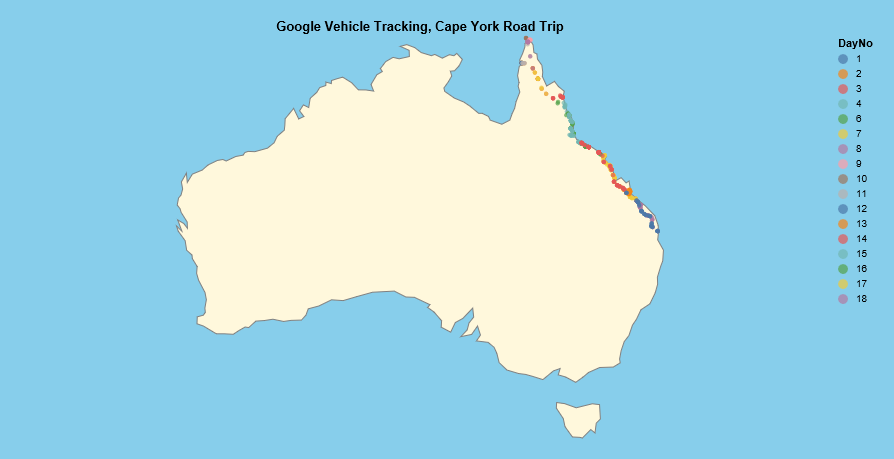

In [230]:
c11 = alt.layer(c1,c4,
         ).configure(padding=20, background='skyblue',
         ).configure_view(strokeWidth=0)  # turn off cell box

c11

Create a chart of location joined into a line

In [231]:
c2 = alt.Chart(ld, title='Google Vehicle Tracking, Cape York Road Trip',
              ).mark_line(
    ).encode(
    longitude='longtitude:Q',
    latitude='latitude:Q', 
    order = 'datetime:T',
    color = alt.Color('DayNo:N', legend = alt.Legend(title='Day Number', ) ),
    #size=alt.value(3),
).project(
    type='equirectangular'
)


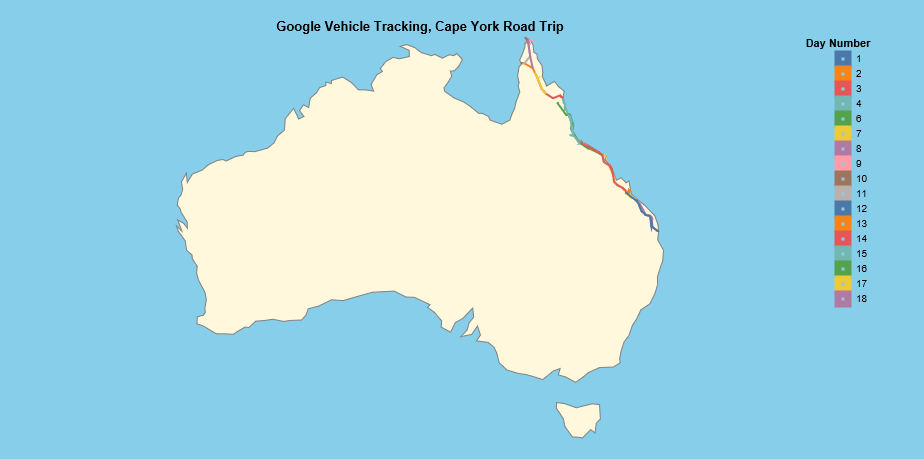

In [232]:
c11 = alt.layer(c1,c2,
         ).configure(padding=20, background='skyblue',
         ).configure_view(strokeWidth=0)  # turn off cell box

c11.configure_legend(symbolType='square', symbolStrokeWidth=7, titleAlign='center')

Use Altair to filter out the outward leg of the trip


In [233]:
c5 = alt.Chart(ld, title='Cape York Road Trip, Day 1-10').mark_circle(size=40,
    ).encode(
    longitude='longtitude:Q',
    latitude='latitude:Q', 
    order = 'datetime:T',
    color = 'DayNo:N',
).project(
    type='equirectangular'
).transform_filter(
    alt.expr.datum.DayNo < 11)


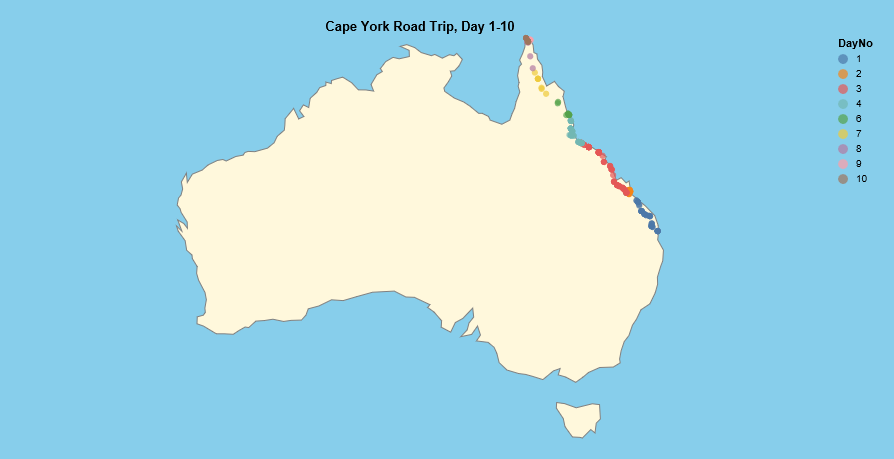

In [234]:
c11 = alt.layer(c1,c5,
         ).configure(padding=20, background='skyblue',
         ).configure_view(strokeWidth=0)  # turn off cell box

c11

And the homeward leg of the trip

In [235]:
c5 = alt.Chart(ld, title='Cape York Road, Heading Home ').mark_circle(size=50,
    ).encode(
    longitude='longtitude:Q',
    latitude='latitude:Q', 
    order = 'datetime:T',
    color = 'DayNo:N'
).project(
    type='equirectangular'
).transform_filter(
    alt.expr.datum.DayNo > 10
)

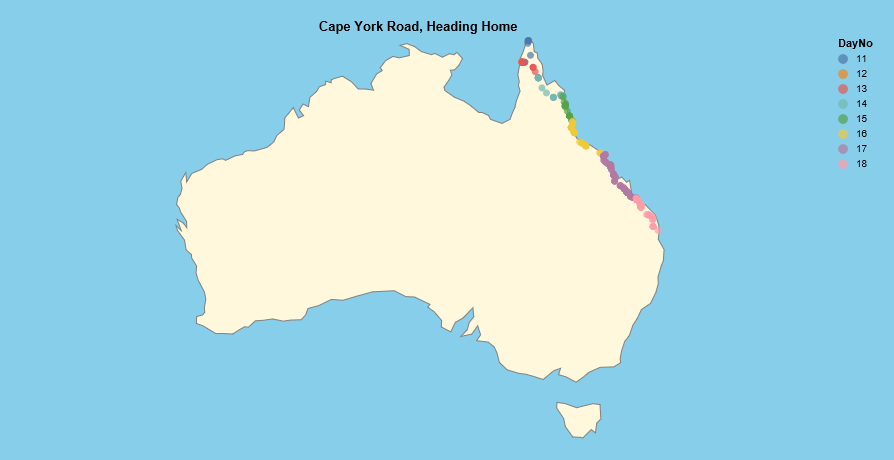

In [236]:
c11 = alt.layer(c1,c5,
         ).configure(padding=20, background='skyblue',
         ).configure_view(strokeWidth=0)  # turn off cell box

c11

The version iwith an Altair trail (could drive line opacity, thickness, etc); this just has a plain line

In [237]:
c6 = alt.Chart(ld, title='Cape York Road Trip, Heading Home ').mark_trail(size=5
    ).encode(
    longitude='longtitude:Q',
    latitude='latitude:Q', 
    order = 'datetime:T',
    color = 'DayNo:N'
).project(  
    type='equirectangular'
).transform_filter(
    alt.expr.datum.DayNo > 10
)

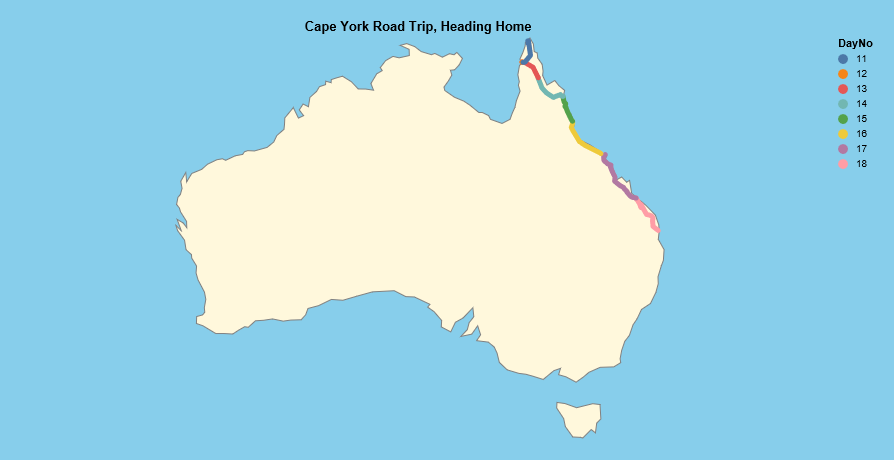

In [238]:
c11 = alt.layer(c1,c6,
         ).configure(padding=20, background='skyblue',
         ).configure_view(strokeWidth=0)  # turn off cell box

c11

## Annotate map with town names

List the names of the road trip stops

In [239]:
names=['Brisbane', 'Rockhampton', 'Townsville', 'Cairns', 'Laura', 'Bamaga', 'Weipa', 'Coen', 'Cooktown', 'Innisfail', 'Gladstone']


Use geopandas to read the Natural Earth populated places database

In [240]:
cities = gpd.read_file('../data/shapefiles/ne_10m_populated_places_simple.shp')

In [241]:
cities.head(5)


,scalerank,natscale,labelrank,featurecla,name,namepar,namealt,diffascii,nameascii,adm0cap,...,pop_min,pop_other,rank_max,rank_min,geonameid,meganame,ls_name,ls_match,checkme,geometry
0,10,1,8,Admin-1 capital,Colonia del Sacramento,None,None,0,Colonia del Sacramento,0.0,...,21714,0,7,7,3443013.0,None,None,0,0,POINT (-57.84000247340134 -34.47999900541754)
1,10,1,8,Admin-1 capital,Trinidad,None,None,0,Trinidad,0.0,...,21093,0,7,7,3439749.0,None,None,0,0,POINT (-56.90099656015872 -33.5439989373607)
2,10,1,8,Admin-1 capital,Fray Bentos,None,None,0,Fray Bentos,0.0,...,23279,0,7,7,3442568.0,None,None,0,0,POINT (-58.3039974719095 -33.1389990288435)
3,10,1,8,Admin-1 capital,Canelones,None,None,0,Canelones,0.0,...,19698,0,6,6,3443413.0,None,None,0,0,POINT (-56.28400149324307 -34.53800400667546)
4,10,1,8,Admin-1 capital,Florida,None,None,0,Florida,0.0,...,32234,0,7,7,3442585.0,None,None,0,0,POINT (-56.21499844799416 -34.09900200521719)


Filter in those names in our list

In [242]:
mask = [x in names for x in cities['name']]
mycities = cities[mask].copy()

In [243]:
mycities.head()

,scalerank,natscale,labelrank,featurecla,name,namepar,namealt,diffascii,nameascii,adm0cap,...,pop_min,pop_other,rank_max,rank_min,geonameid,meganame,ls_name,ls_match,checkme,geometry
5621,6,30,3,Populated place,Weipa,None,None,0,Weipa,0.0,...,2830,0,4,4,-1.0,None,Weipa,0,0,POINT (141.8666271557285 -12.66663124710453)
5626,6,30,3,Populated place,Gladstone,None,None,0,Gladstone,0.0,...,27621,27021,7,7,2165478.0,None,Gladstone,1,0,POINT (151.2467264396201 -23.85333860392018)
5628,6,30,3,Populated place,Innisfail,None,None,0,Innisfail,0.0,...,9271,0,6,5,2162683.0,None,Innisfail,1,0,POINT (146.0386722403805 -17.5313472301969)
6776,4,50,3,Populated place,Rockhampton,None,None,0,Rockhampton,0.0,...,52199,52199,8,8,2151437.0,None,Rockhampton,1,0,POINT (150.5200007722997 -23.36391111368386)
6777,4,50,3,Populated place,Cairns,None,None,0,Cairns,0.0,...,109989,0,9,9,2172797.0,None,Cairns,1,0,POINT (145.7633309460742 -16.8878398586055)


Extract the locations to make the interface to Altair easier

In [244]:
mycities['Latitude'] = mycities['geometry'].y
mycities['Longitude'] = mycities['geometry'].x
mycities = mycities[['name', 'Longitude', 'Latitude']].copy()

In [245]:
mycities

,name,Longitude,Latitude
5621,Weipa,141.866627,-12.666631
5626,Gladstone,151.246726,-23.853339
5628,Innisfail,146.038672,-17.531347
6776,Rockhampton,150.520001,-23.363911
6777,Cairns,145.763331,-16.887840
7115,Townsville,146.769997,-19.249950
7116,Brisbane,153.033147,-27.453085


Create two charts, one with squares for town location, one with text of name

In [246]:
c7 = alt.Chart(mycities).mark_text(size=10, align='left'
    ).encode(
    longitude='Longitude:Q',
    latitude='Latitude:Q', 
    text = 'name'
).project(
    type='equirectangular'
)
c8 = alt.Chart(mycities).mark_square(size=30, color='red',
    ).encode(
    longitude='Longitude:Q',
    latitude='Latitude:Q', 
    text = 'name'
).project(
    type='equirectangular'
)

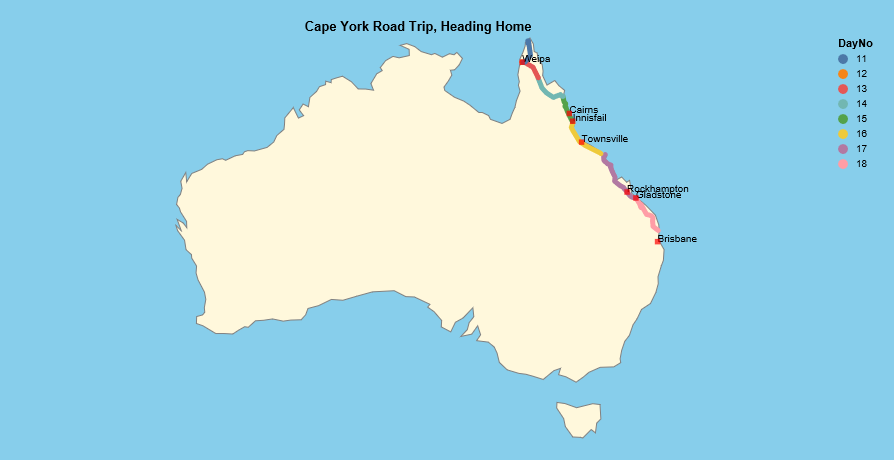

In [247]:
c11 = alt.layer(c1,c6,c7,c8,
         ).configure(padding=20, background='skyblue',
         ).configure_view(strokeWidth=0)  # turn off cell box

c11